## 3. `blender_tissue_cartography` add-on

You can use `blender_tissue_cartography` in two forms:

1. The `blender_tissue_cartography` python library
2. The `blender_tissue_cartography` blender add-on

For sophisticated use cases (highly dynamic datasets, custom computer vision operation), or automated pipeline, use the python library. Most users though can start with the blender add-on, which allows you to carry out almost all steps of the tissue cartography pipeline within blender's graphical user interface.

The add-on has been tested with **blender version 4.3.2** - no guarantees for other versions!

### Installation

1. From [GitHub](https://github.com/nikolas-claussen/blender-tissue-cartography), download the file `blender_addon/blender_tissue_cartography-1.0.0-[XXX].zip` where `[XXX]` is your operating system (e.g. `linux_x64`).
    - If your operating system is not available, you can also download `blender_addon/blender_tissue_cartography.py`. In this case you will need to install the pyhton libraries `scikit-image` in Blender's Python interface.

2. [Install the add-on](https://docs.blender.org/manual/en/latest/editors/preferences/addons.html): Click "Edit ->  Preferences -> Add-ons -> Add-on Settings -> Install from disk" and select the file you just downloaded.

3. Restart Blender. The add-on can now be found under "Scene -> Tissue Cartography".

4. (Optional) Download the tutorial dataset(s): https://github.com/nikolas-claussen/blender-tissue-cartography/tree/main/nbs/Tutorials/addon_example 

### Add-on user interface

The add-on can now be found under "Properties -> Scene":

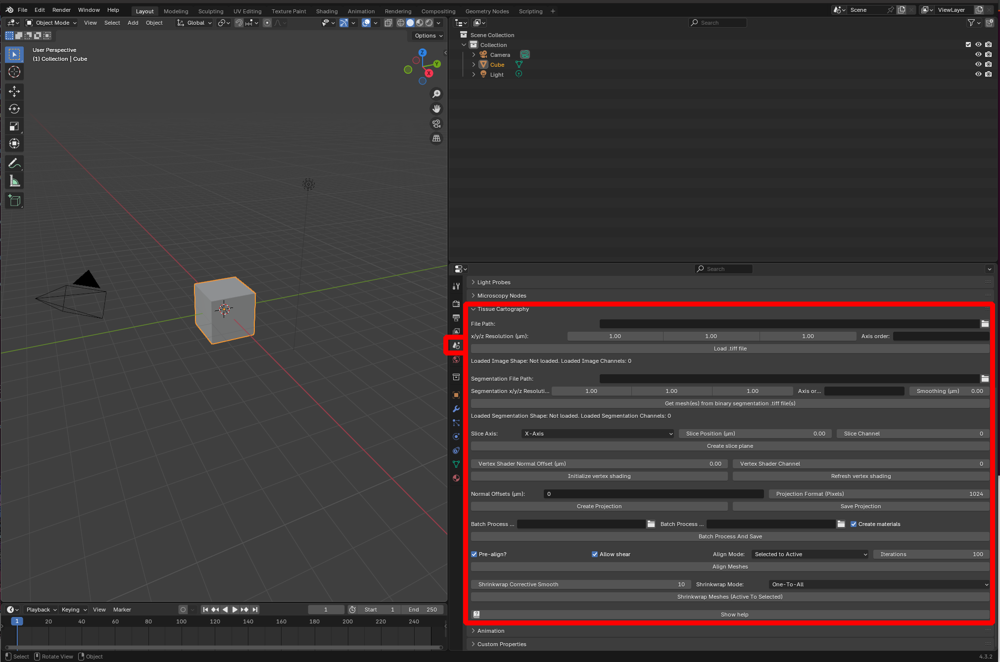

## Workflow for a single dataset / single timepoint

Let's see the functionality of the add-on at work on the example dataset in the `nbs/Tutorials/addon_example` folder.

### Loading a volumetric dataset

We start by importing a volumetric dataset, in this case `nbs/Tutorials/addon_example/Drosophila_CAAX-mCherry.tif` ([download it here](https://github.com/nikolas-claussen/blender-tissue-cartography/tree/main/nbs/Tutorials/addon_example)). This is a light-sheet recording of the gastrulating _Drosophila_ embryo. You can inspect it in Fiji:

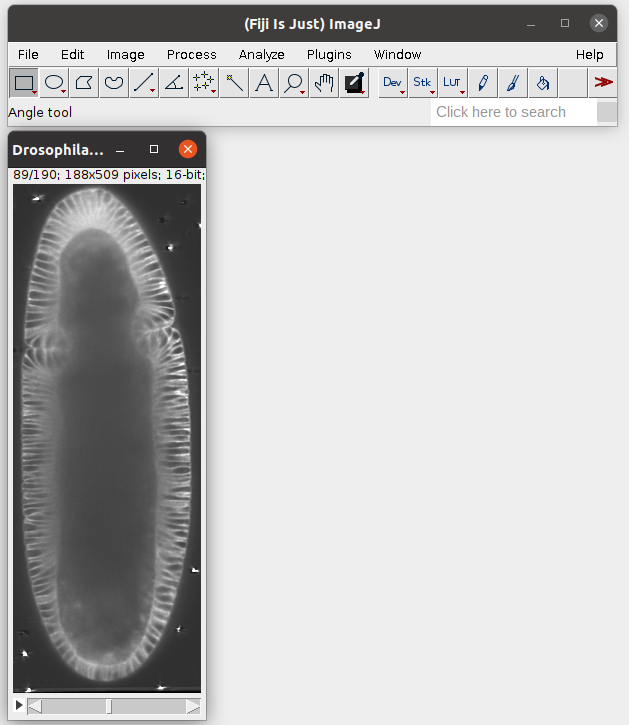

To load the dataset into Blender, click on "File Path" to select the `.tif` file, specify the resolution in microns/pixel for the $x,y,z$ axes (in this case, $1.05 \mu m$ for all axes), and click "Load .tiff file":

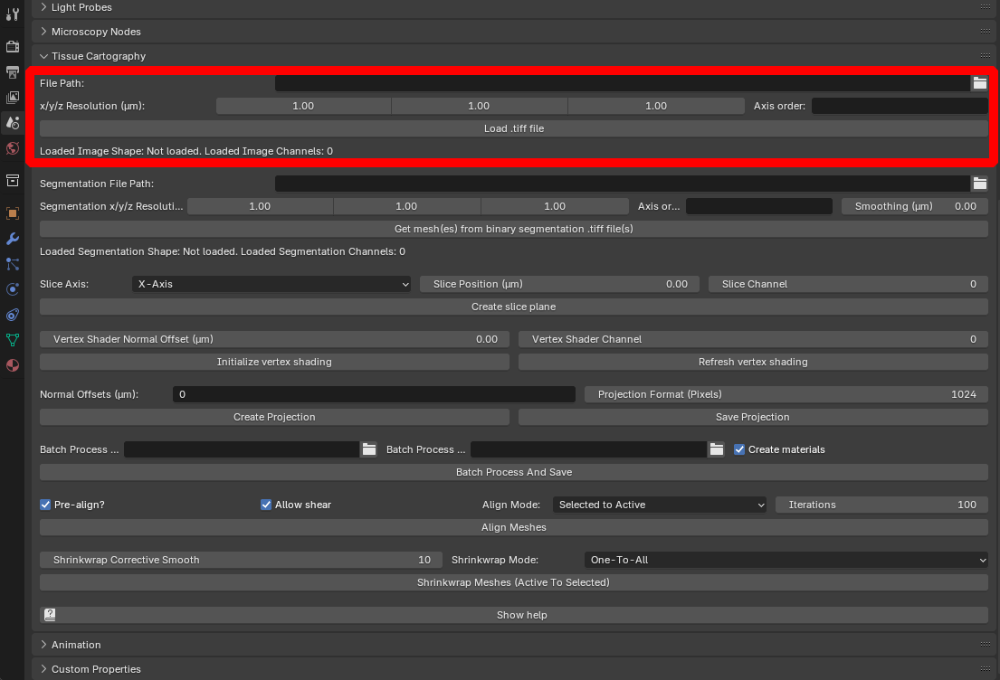

The loaded dataset is represented by a box mesh with dimensions equal to those of the image volume in microns. The add-on displays the shape (number of pixels along each axis) and the number of channels):

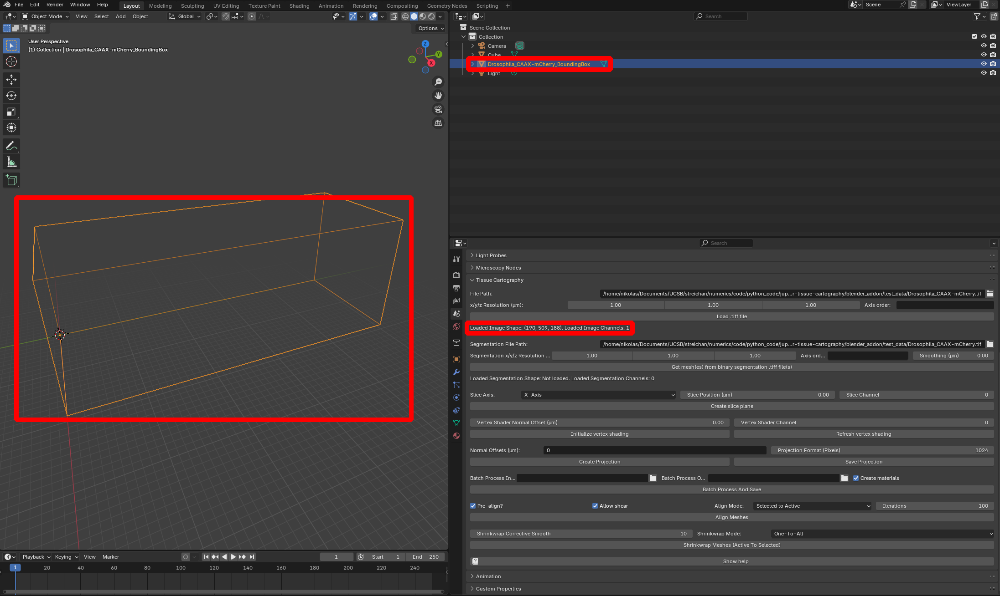

**Multi-channel data** The add-on supports both single-channel and multi-channel data (so `.tif` files with 3 or 4 dimensions). For time-series data, you need to provide one `.tif` per timepoint (see section on "Batch Processing" below).

**Axis order** The add-on attemps to automatically recognize which axis is the channel axis and which one is $x,y,z$. If this goes wrong, you can use the "Axis order" input to specify the axis order of the  `.tif` file. Input as `xyz`, `zxy`, ... for single-channel and `cxyz`, `zcyx`, ... for multichannel data.  

### Loading a mesh

Next, we need to obtain a mesh to represent the surface of interest (SOI) onto which we want to project our volumetric data. You have two options:

#### Loading a pre-computed mesh

If you already have a mesh, you can load it into blender via drag-and-drop. Try it with `nbs/Tutorials/addon_example/Drosophila_CAAX-mCherry_mesh_premade.obj`

**Mesh units** Importantly, the units of your mesh coordinates need to be in physical units, i.e. microns (and not pixels)!

**Mesh axis order** When importing a mesh into blender, you have to choose how blender interprets the $x,y,z$ axes. It is important to keep this choice consistent -  please select "Forward axis: Y" and "Up axis: Z"

#### Creating a mesh from a segmentation

Alternatively, you can create a mesh from a 3D segmentation, created for example by Ilastik (see Tutorial 1). This should be a single-channel volumetric `.tif`-file, with values close to 1 representing the inside, and close to 0 the outside of your sample.

**Note:** If your surface of interest cannot be represented by the boundary of a volume (e.g. an open sheete floating around in free space), or if you have a segmentation of a hallow shell instead of a solid object, please see Tutorial 7.

An example segmentation is provided by `nbs/Tutorials/addon_example/Drosophila_CAAX-mCherry_subsampled-image_Probabilities.tif`
Here is what is looks like in Fiji:

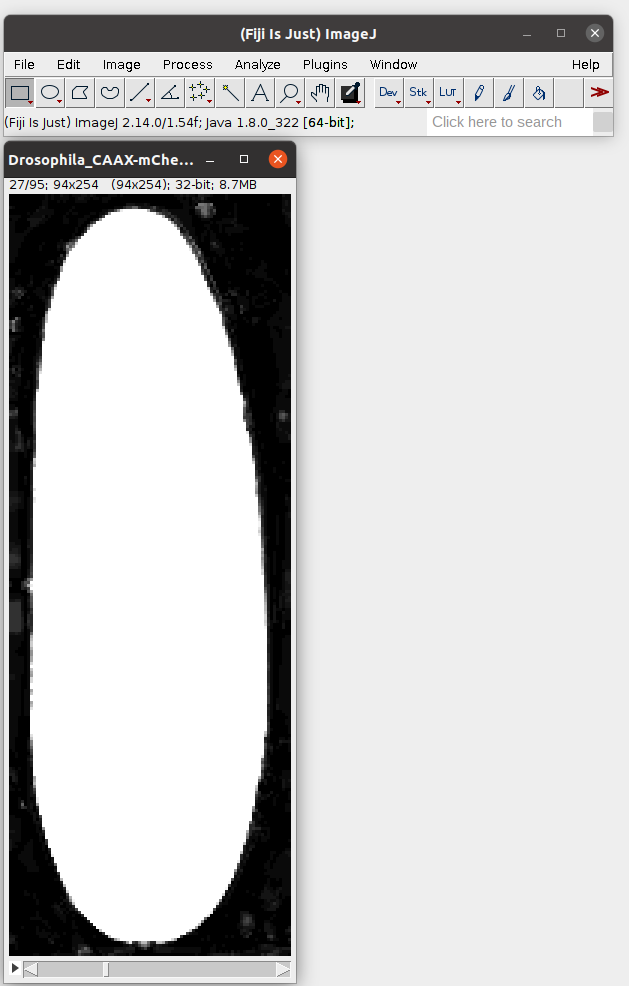

Click on "Segmentation File Path" to select this file, and specify the resolution (here $2.1\mu m$ for all axes). The "Segmentation smoothing" option allows creating a smooth mesh from the blocky/pixelized segmentation data:

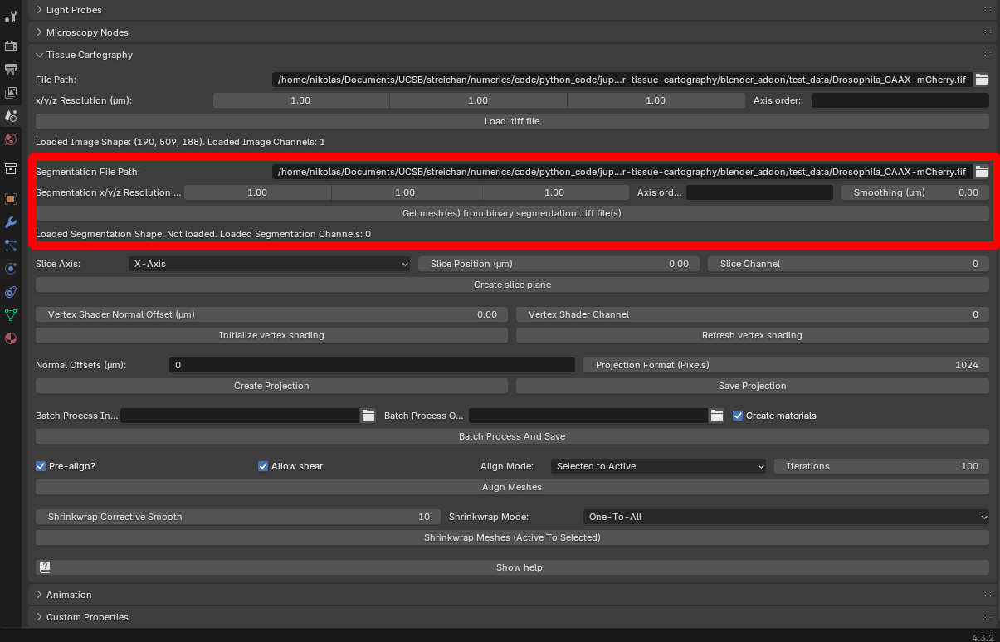

**Segmentation resolution** The resolution of your segmentation `.tif` file can be different from the image data. This is to allow you to downsample your image when you segment it (e.g. in Ilastik), which makes the segmentation often much faster.

After clicking "Get mesh from binary segmentation .tiff file", you should see a new mesh object in your scene:

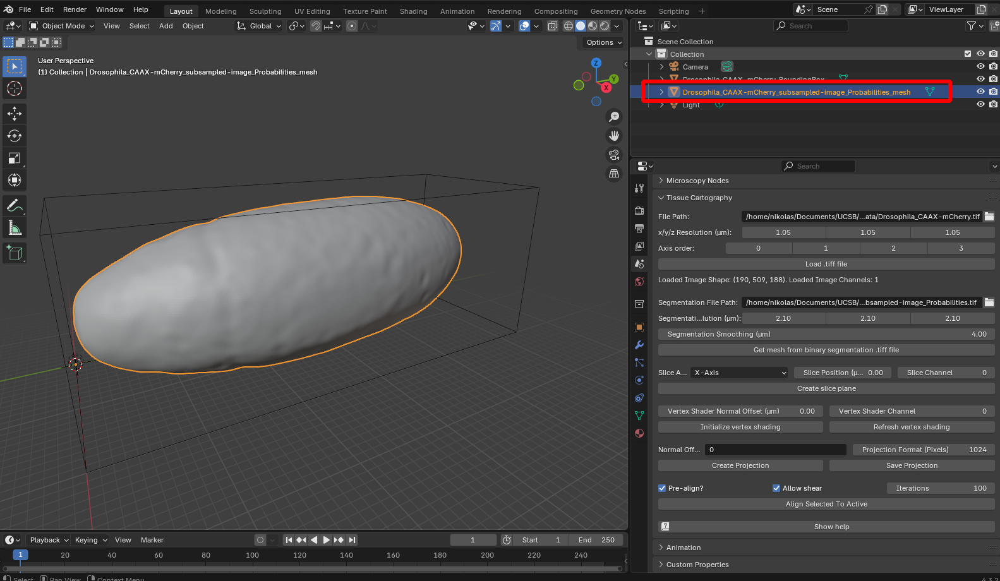

As you can see, the mesh of our surface lies nicely inside the bounding box of the image, indicating that they are correctly aligned.

**Batch processing** Selecting a folder instead of a file under "Segmentation File Path" batch processes all files in folder. Selecting a multi-channel `.tif` file creates one mesh per channel (for example, if you have a segmentation with multiple labels for multiple objects).

### Data storage and representation in the `blender_tissue_cartography` add-on

Both 3D image data and the projected 2D image data we will compute below are always _associated_ with a mesh. For example, the 3D image data we loaded is associated with the "BoundingBox" mesh `Drosophila_CAAX-mCherry_BoundingBox`. What dataset the `blender_tissue_cartography` operations are applied to is determineed by which mesh you have selected (orange outlines) in blender. 

### Visualize 3D data using orthogonal slices

To visualize the 3D data, we can create slices of it along the $x,y,z$ axes and load them into blender. To do this, select the bounding box representing the 3D data (it should be outlined in orange), chose an axis, a position along the axis, and a channel (here channel 0, since this is a single-channel dataset):

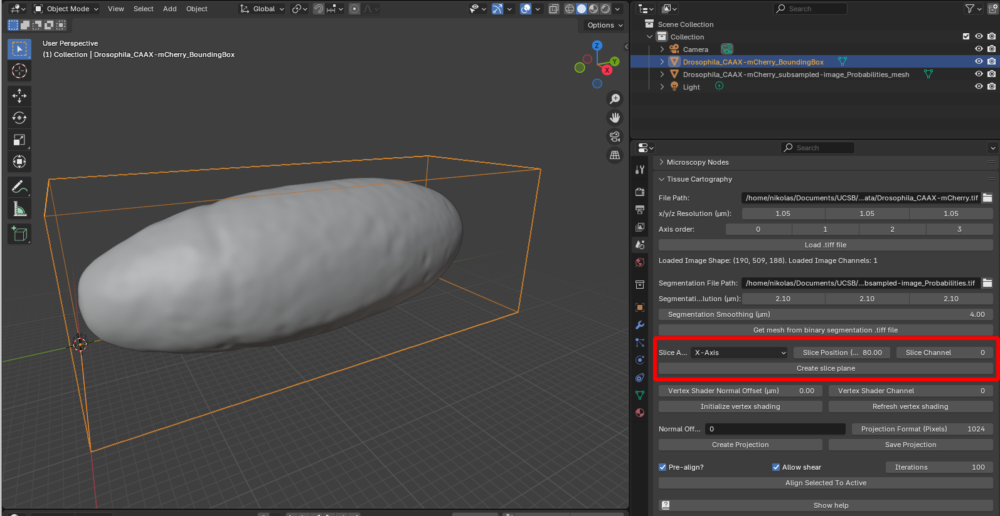

Click "create slice plane", and select "Material preview" to see the image texture on the slice:

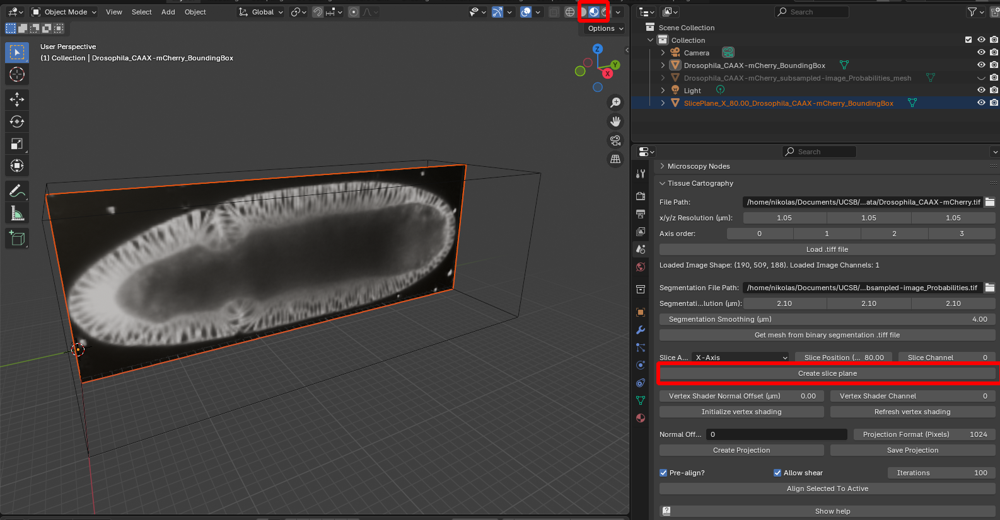

When toggling the visibility of the SOI mesh back on, we can see that it fits nicely along the contours of the 3D data:

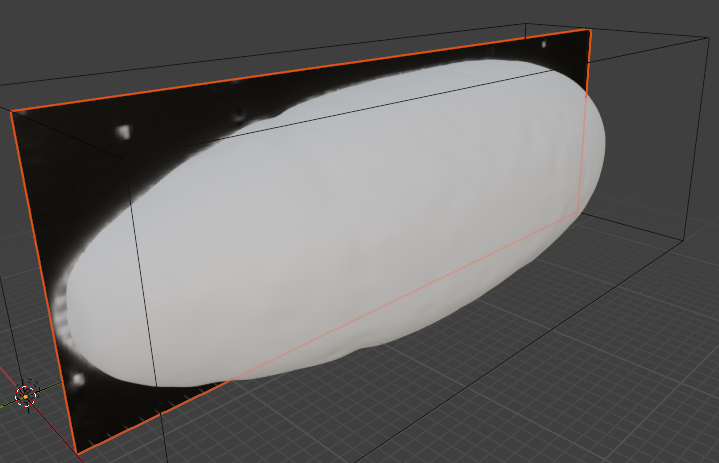

#### Volumetric rendering using MicroscopyNodes

`.tiff` files can also be rendered "volumetrically" in blderm using the [MicroscopyNodes](https://github.com/oanegros/MicroscopyNodes) plugin. This means each voxel will emit (or absorb) light, showing the full 3D-data instead of just a slice. However, this can be computationally expensive and may not give you a "helpful" view of the data if the 3D data is complex or shows a large object.\

***MicroscopyNodes coordinates** MicroscopyNodes scales and translates the `.tiff` data (scale 0.02 + centering in $x,y$). To overlay the volumetric object created by MicroscopyNodes with the `blender_tissue_cartography` representation, you need to undo this - go to "Object properties -> Transform":

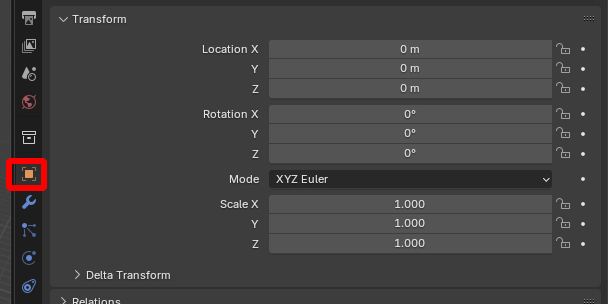



### Optional - remeshing

By selecting "Wireframe" shading, we can see that the mesh has a lot more vertices/detail than necessary to represent the shape of the embryo. For many downstream applications, it is useful to have a mesh with a lower resolution. Go to the "Sclupting workspace" and click on "Remesh", using whatever voxel-size you think is reasonable to control the mesh resolution:

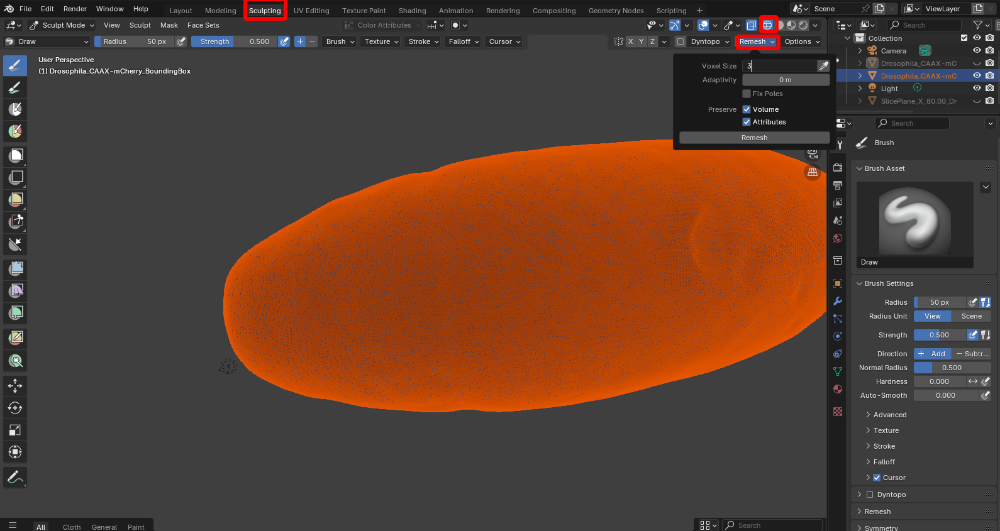

### Vertex shading

The add-on features two ways of projecting the 3D image data onto the SOI mesh. The first is called "Vertex shading", which looks up the image intensity at each vertex of the mesh and uses it to color the mesh. This does not require any UV map (cartographic projection of the mesh to the plane).

Select both the bounding box representing the volumetric image, and the mesh onto which you want to project the data. Select the channel you want. You can use the "Normal offset" button to look up the image intensity at the position of the vertex shifted inwards or outwards along the surface normal. After clicking "Initialize vertex shading" you should see the image projected onto the surface:

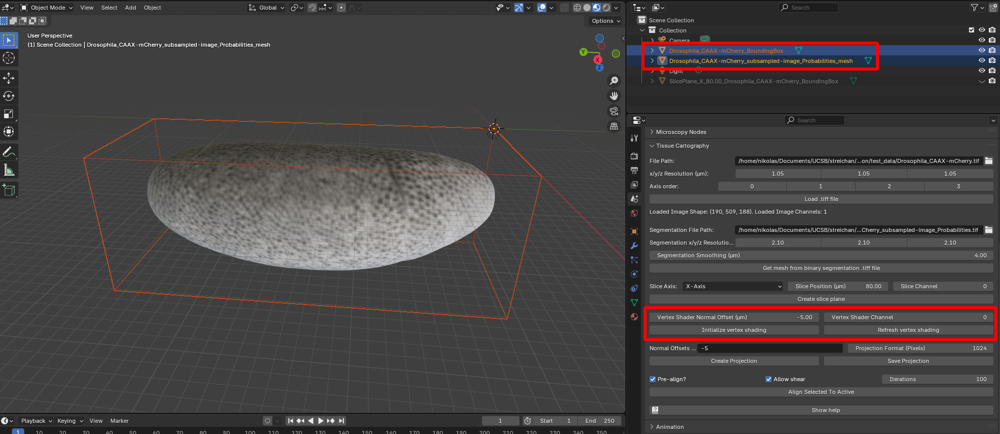

**Use case** Use this to get a quick idea of the image intensity of your mesh before creating your cartographic projection, or if you want to interactively sculpt the mesh (e.g. fixing holes, or deforming the mesh so it matches the 3D data better). Use the "Refresh vertex shading" button to update the vertex colors every time you sculpt.

**Resolution** You will need a relatively high-resolution mesh (with many vertices), or the vertex shader will look blurry. The resolution of cartographic projections (see below) on the other hand is _independent_ of the mesh resolution - you can get a high-resolution projection with a coarse mesh.


#### Fine-tuning the vertex shading

The new texture of the mesh is controlled by a "Material" which you can edit in the "Shading" workspace for fine-tuning (e.g. adjusting brightness or contrast):

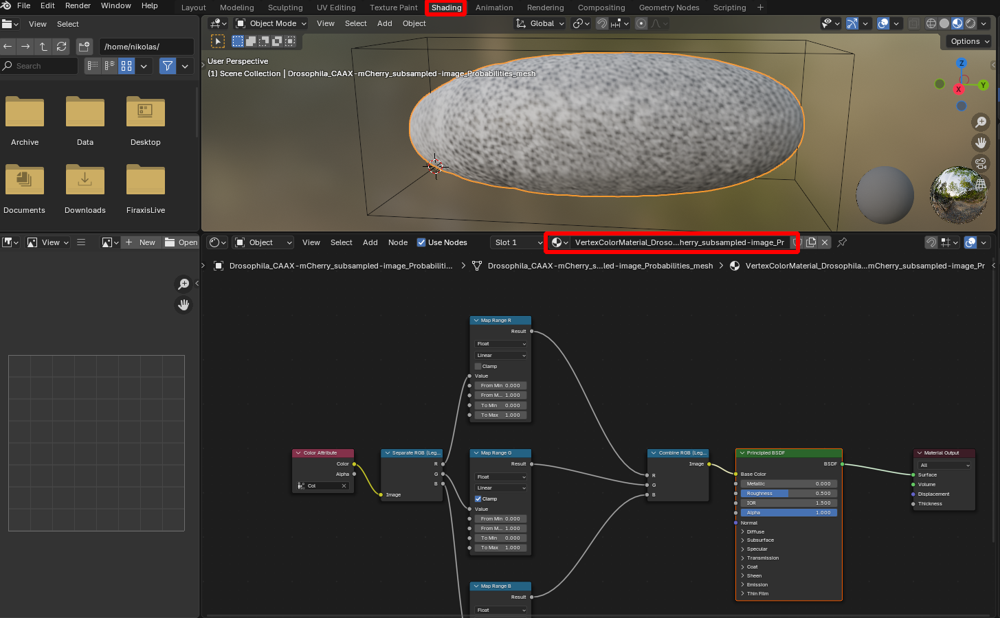


### Cartographic projection

Vertex shading can give you a first idea of the image intensity projected onto the mesh, but it has several disadvantages:

1. The projected data is saved as one intensity per vertex, instead of as continuous 2D image, which makes quantitative image analysis (cell segmentation, for example) very difficult
2. The mesh resoution controls the image resolution so you need a very dense mesh (which is inefficient)
3. You can only see one part of the 3D shape at a time, which makes visualization harder

Instead, we now compute a cartographic projection of the data, which unwraps the mesh to a plane (much like a map of the globe) and projects the 3D image data to a genuine 2D image.


#### Unwrap mesh using UV editor

We first need to unwrap our mesh. This can be done in the "UV Editing" workspace (see previous tutorial). Here, we use the fully automatic "Smart UV Project" algorithm ("UV -> Unwrap -> Smart UV project"):

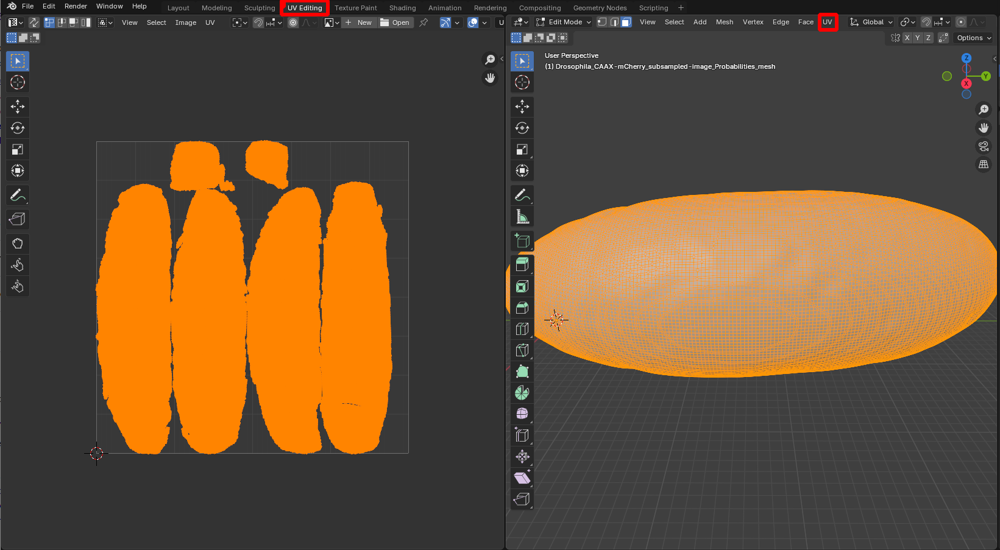

Blender has many tools for creating cartographic projections, from cylindrical and spherical projections to more sophisticated algorithms that minimize distortion. You can also choose where your mesh is cut when it is mapped into the plane ("seams"). See tutorials 2 and 5, and 6.

**Self-intersections** It is important to try to unwrap the mesh while avoiding self-intersection (where the mesh is folded onto itself in 2D). This is bad because the multiple 3D positions are mapped to the same cartographic location. For example, if you use the "project from view on the example UV cube:

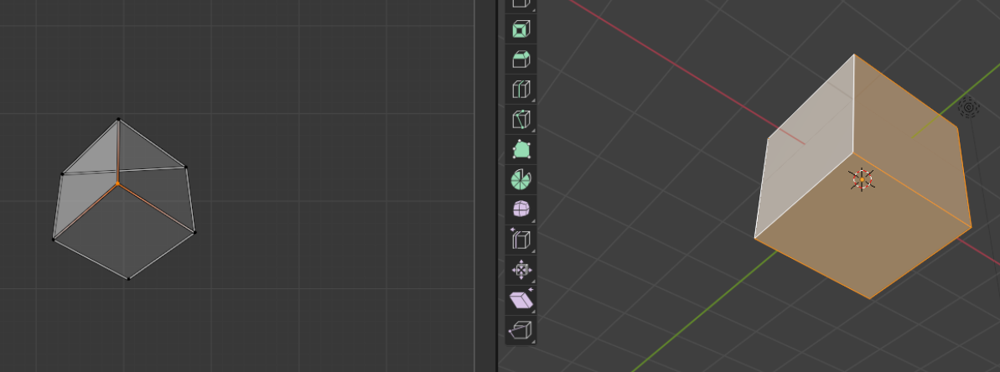

#### Compute a cartographic projection

Now we are ready to compute a cartographic projection using the add-on. The add-on can compute _multilayer projections_ where each layer shows the image intensity at a given distance from the surface of interest inwards or outwards along the surface normal (a bit like the layers of an onion). You specify the layers you want as a comma-separated list using the "Normal offsets" field. Positive and negative values represent an outwards, respectively inwards shift (in microns).

The projected data will always be a square image, covering the _UV square_ (the 2D region into which we unwrapped our mesh in the preceding step). The number of pixels of the image is controlled by the "Projection Format" field. 
Select _both_ the mesh and the 3D data set, and click "Create Projection":

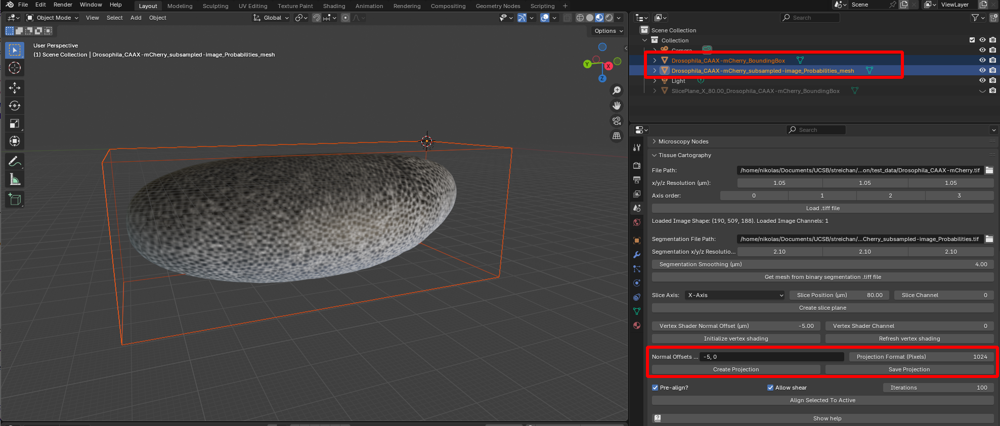

The projected data just created is now associated with the mesh, and can be visualized in blender thanks to a newly created "Material". You can check it out in the shading tab. You can look at the 2D projected image on the left. On the bottom, you can modify the connections of the nodes to determine, for instance, which layer of the multi-layer projection is shown:

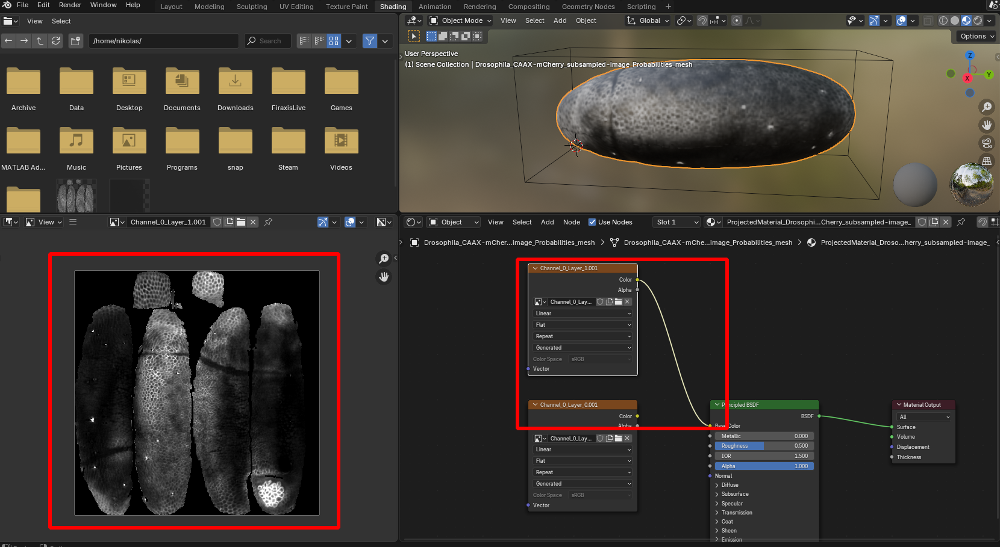

Regions of the UV square not covered by the unwrapped mesh are black.

#### Save a cartographic projection

Finally, we can save the cartographic projection to disk. Select the mesh of which you want to save the projection, and click "Save projection":

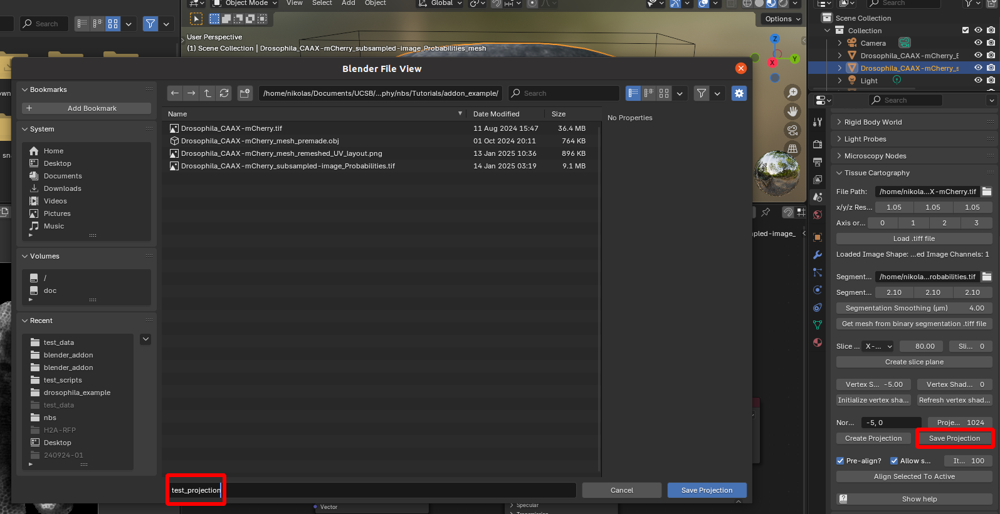

This creates three `.tiff` files: `test_projection_BakedData.tif` (the projected 3D data), `test_projection_BakedPositions.tif`, and `test_projection_BakedNormals.tif`. The latter two are the 3D positions and surface normals (as RGB images, with red=$x$ and so on), which are important for downstream analysis. 

Crucially, the projected image data is _not_ rescaled, normalized, or distorted in any way - it reflects the numerical values of the voxel intensities in the original 3D data. Let's open this in Fiji:

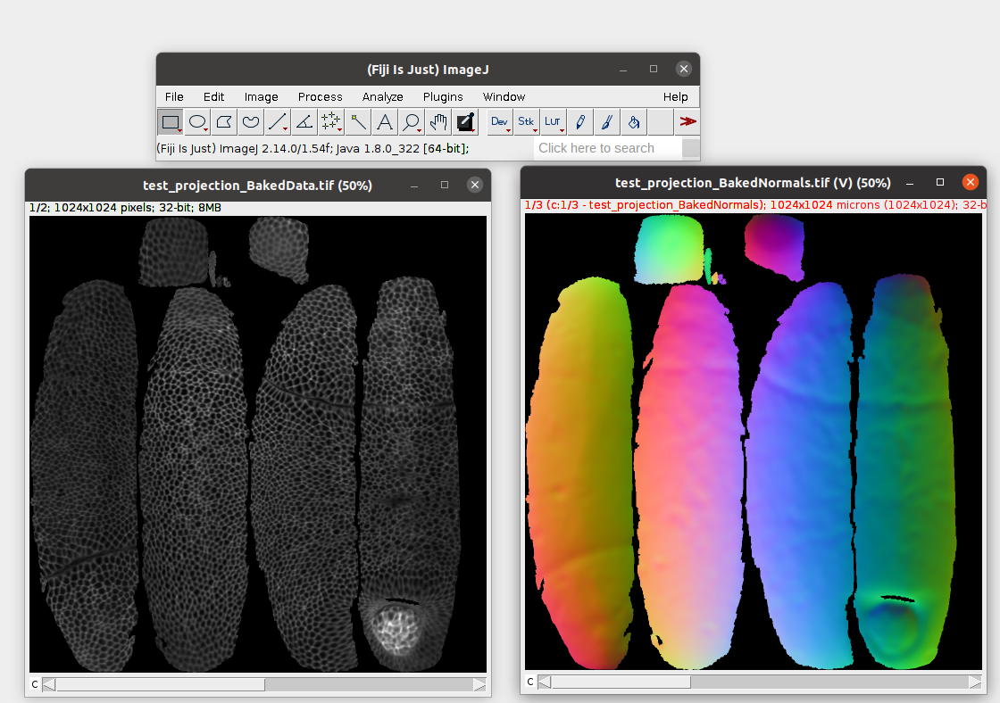

For the projected data, the $z$-axis of the stack represents the different layers we chose when projecting the data (-5 and 0 microns from the surface).

### Annotating data in blender

You can annotate the projected data in Blender using the "Texture Paint" workspace. This allows you to paint on the 3D surface (for example, highlighting some cells you are interested in), and having the data saved to 2D on top of the projected image data. You can save the results to disk using teh "Image" button. Here is a simple example:

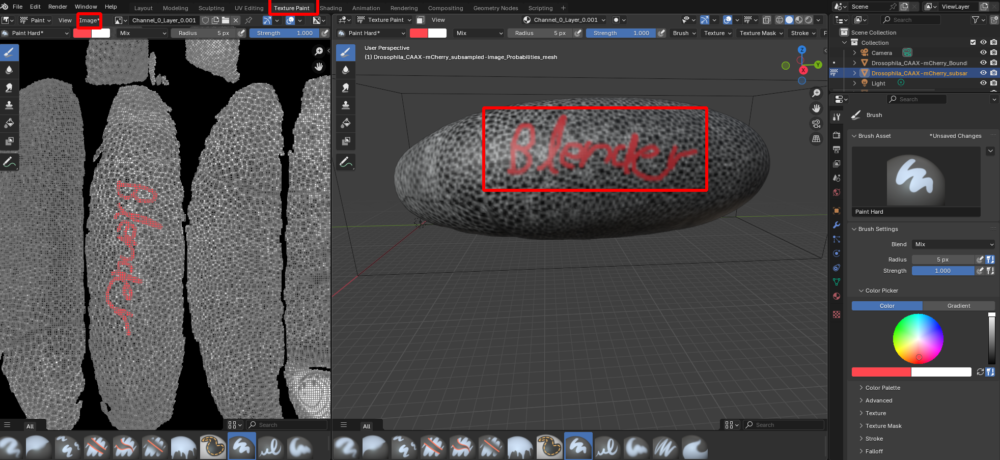

### Visualizing UV distortion

To visualize the distortion created by unwrapping a mesh, you can create a new material that projects a colored grid onto the mesh surface. Go to the shading editor and add a new material, with an image input ("Shift+A" -> "Texture" -> "Image Texture"), and select new image with generated type "Color Grid" or "UV Grid":

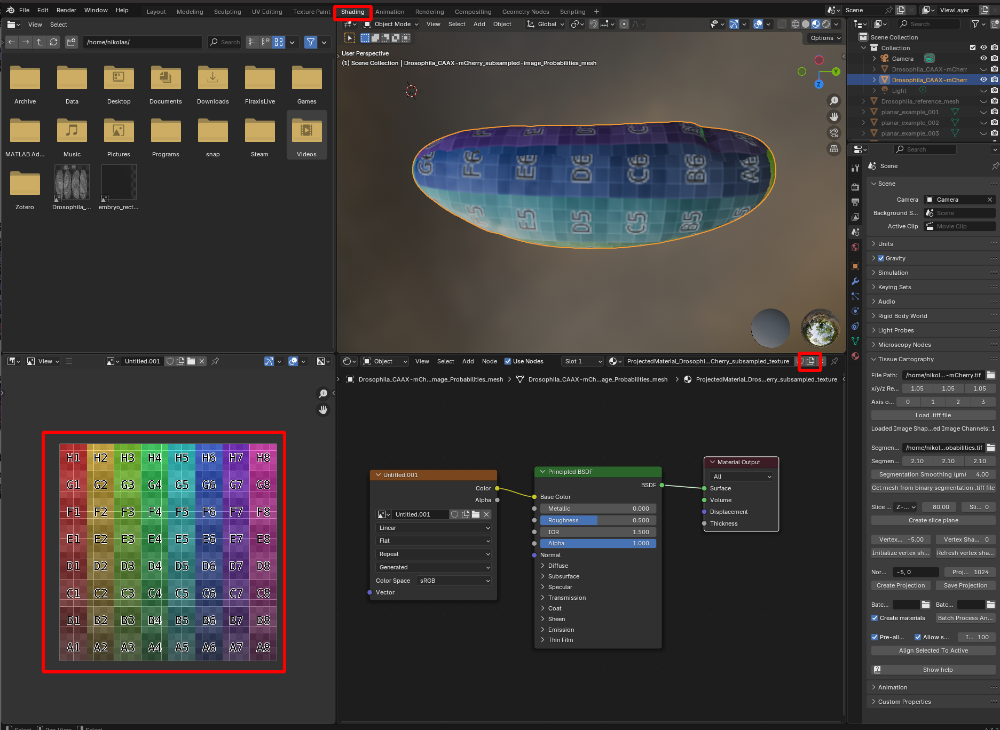

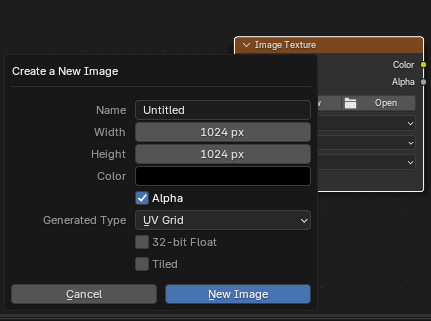

You can now see which region in UV space corresponds to which region in 3D, and based on the size and the shape of the squares gauge how much distortion there is.

## Workflow for multiple datasets / multiple timepoints

So far, we have looked at a single volumetric dataset in isolation. But often, such a dataset is part of a larger collection - for example, frames/timepoints of a movie or different recordings of _Drosophila_ embryos, whose eggs have very consistent shapes. This raises two new issues:

1. How to batch-process multiple datasets?
2. How to obtain "the same" cartographic projection across multiple datasets?

We now explain how to deal with these issues using tools provided by the `blender_tissue_cartography` add-on and native blender.
Please see also tutorials 8 and 9.

### Representation of time-lapse data

In `blender_tissue_cartography`, time-lapse datasets (i.e. movies) are represented frame-by-frame: for each timepoint, you need to provide a volumetric `.tif` file, and a mesh. **Note:** it is a good idea to give your meshes and .tif files indicative names, e.g. `Time_000001_mesh.obj`.

### Batch processing

The `blender_tissue_cartography` add-on allows you to batch-process multiple 3D images (for example, the frames of a movie) using the Batch processing panel:

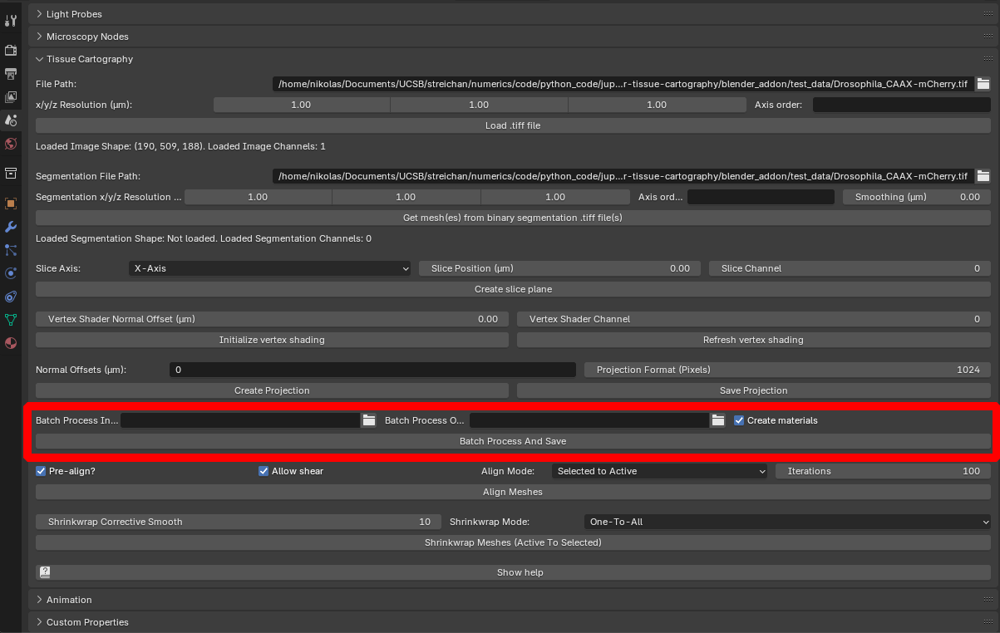

It works as follows:

1. Load the meshes for all images you want to process into Blender. **Note:** each mesh needs to have a UV map. See the next section for how to obtain "consistent" UV maps across multiple meshes.
2. Load at least one of the 3D images you want to process into Blender using the "Load .tiff file" button. This file (and its BoundingBox) are used to specify image resolution and the relative position of 3D data and meshes.
3. Place the 3D images you want to process into a single directory (one `.tiff` file per timepoint), and select this directory via "Batch Process Input Directory". 3D images are matched to meshes based on their file name - e.g. a mesh named "timepoint_2" in Blender will look for a `.tif` file called "timepoint_2.tif" or similar.  **Note:** all 3D datasets must have the same resolution and axis order as the one you loaded in step 2.
4. Specify Normal offsets and projection resolution as above.
5. Specify an output directory via "Batch Process Output Directory".
6. Select the BoundingBox from step 2, and all meshes you want to process, and click "Batch Process And Save". The results are written to the output directory. **Warning** if you are processing a large number of files, adding projected textures to blender can result in a very large `.blend` file. You can deactive it using "Create materials"

You can try this out using the data provided in `nbs/Tutorials/addon_example/batch_processing`. It shows 3 timepoints of a lightsheet movie of the _Drosophila_ midgut from [Mitchell et al., 2022](https://elifesciences.org/articles/77355). The meshes are alreay equipped with a UV map.

### Consistent cartographic projections across multiple datasets / multiple timepoints 

It is highly desirable to use the "same" cartographic projection across a collection of related datasets: this faciliates comparison and analysis across datasets, and avoids having to manually re-designing the UV map for each mesh in the collection. This is particularly true for time-lapse data. 

There are, generally speaking, two types of approaches to this question:

1. Define a UV map separately for each mesh in the collection, but using the same procedure/algorithm each time.
2. Define a UV map for a single _reference mesh_, and then _deform/warp_ the reference mesh to "fit" each mesh in the collection. The deformed mesh now fits the surface we want to extract from the 3D data but also has a UV map, allowing you to carry out cartographic projections. This approach is also known as _texture transfer_ or _mesh to mesh mapping_ in the literature.

Getting a consistent UV map across multiple different meshes is a complicated problem (in fact, an area of active research). Which approach you should use depends on your problem. See Tutorial 9 for an in depth-explanation and sophisticated approaches. In the following, we focus on the concrete implementation and the tools provided by the add-on.

#### Algorithmically batch-computing UV maps

For surfaces with relatively simple geometries, approach 1 can work well. One very common example is a surface that can be defined by a height function over a 2D plane, without any "overhangs" (so the mesh coordinates would be something like $(x,y, h(x,y))$ for a height function $h$). For instance, consider the meshes in the folder `nbs/Tutorials/addon_example/batch_processing/planar_meshes`:

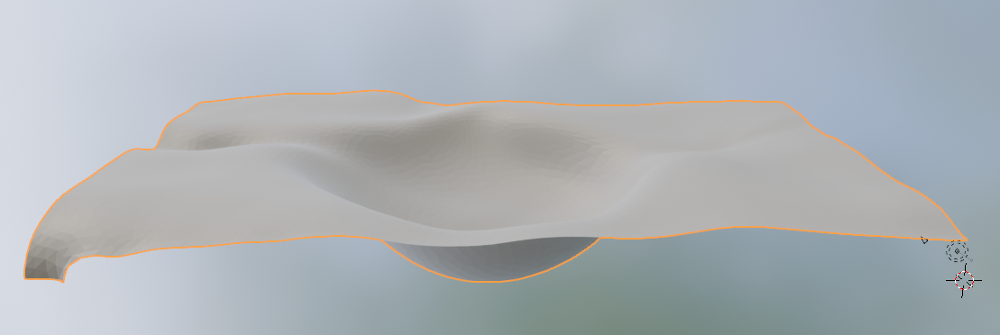

. We can UV-project them using the "Project from view" option. Go to the UV editor, select all meshes you want to process, and navigate to a view that looks straight down on the meshes. Now click "UV->Project from view (bounds)" to get a projection. Done!

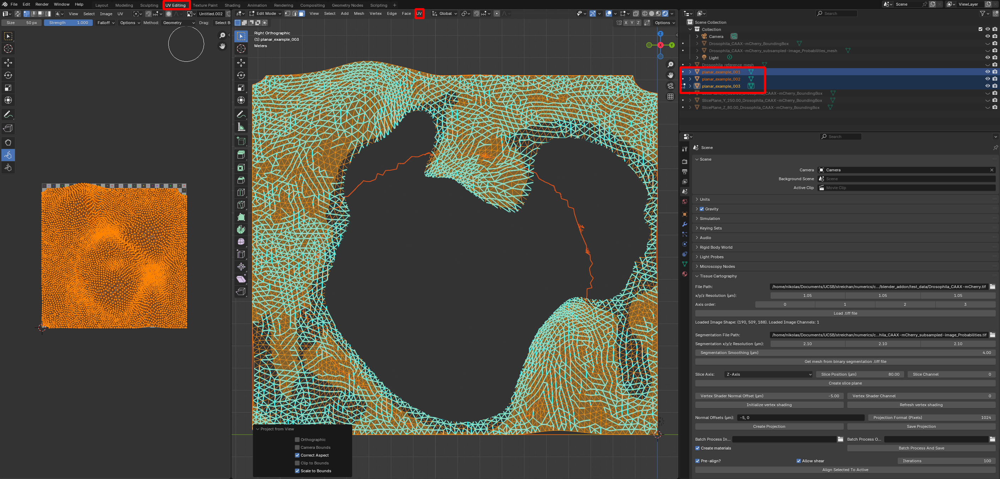

This approach works great for mildly curved surfaces extracted from a confocal microscope $z$-stack (see tutorial 4). 
You can also batch-process using blender's Cylindrical, Cube, or Spherical UV projection operators.

#### Using reference meshes

The advantage of the second, reference mesh approach is that it allows you to use any custom UV map you want, potentially hand-crafted.
Let's see this in action. To "load" a custom cartographic projection and apply it to your surface of interest, you provide a _reference mesh_ - an "idealized" version of your sample with a pre-made UV map. The mesh `nbs/Tutorials/addon_example/Drosophila_reference.obj` is an idealized (smothed, symmetric) _Drosophila_ embryo with a cylindrical cartographic projection. Let's load it into Blender:

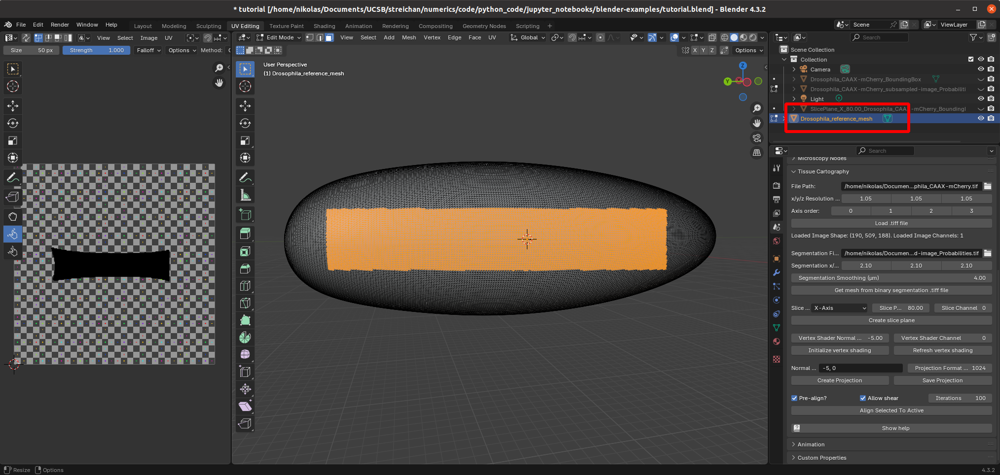

The idea is now to _align_ the reference mesh with the mesh extracted from the 3D data. Then we can use the _reference mesh_ with its pre-made UV map to compute the cartographic projection. Alignment is done in two steps:

1. Rigid alignment. Select the reference mesh and the mesh you want to align to, and click "Align meshes". 

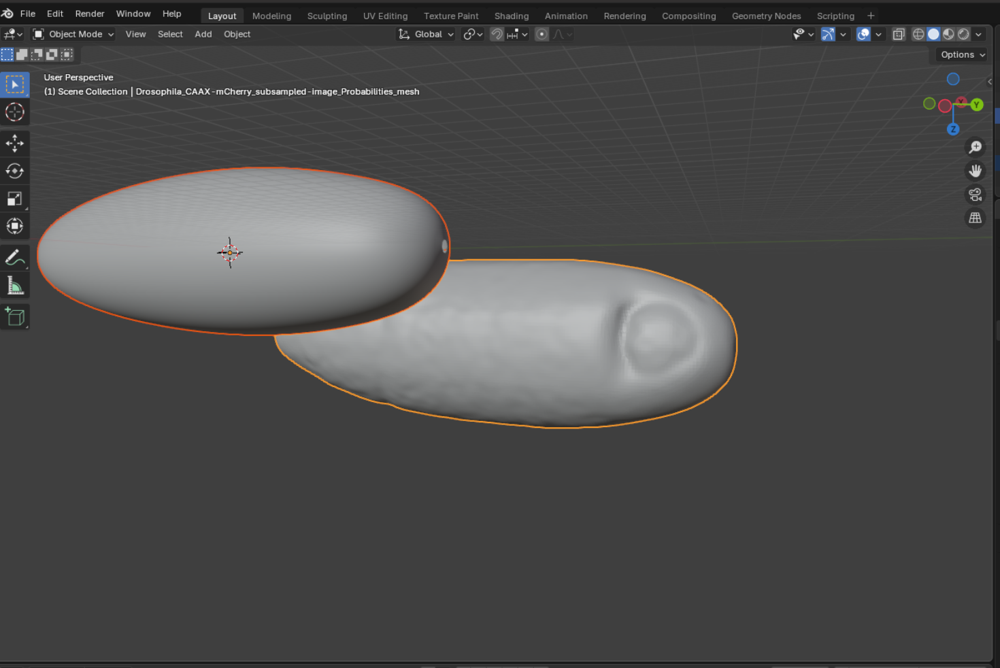

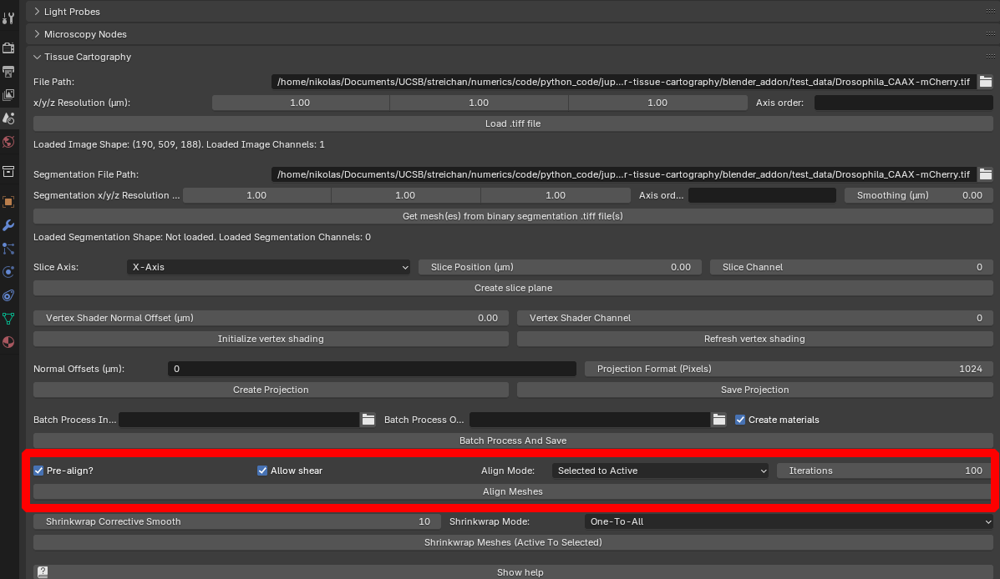

The reference mesh will be rotated, scaled, and translated to match the data mesh:

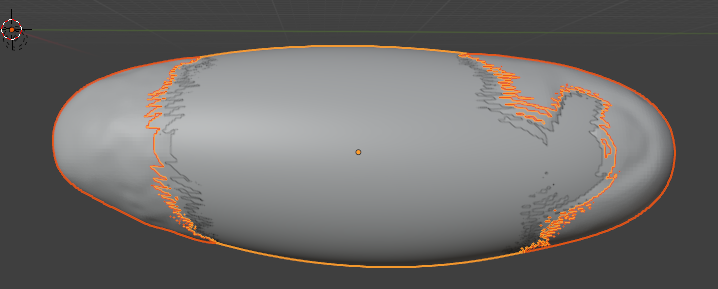

If we carry out a cartographic projection using the reference mesh now, it won't look great: the reference mesh is not a great fit to the 3D data, and so the projection has "holes":

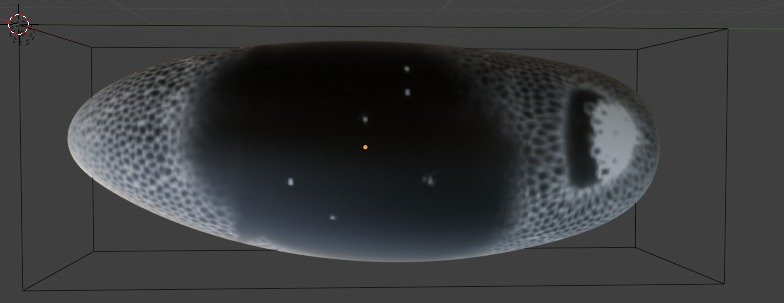

2. Shrink wrapping. To fix this, we now project each point on the reference mesh to the closest point on the data mesh. This is called shrink-wrapping. Click on "Modifiers" and add a "Shrink-wrap" modifier with the correct target to the reference mesh:

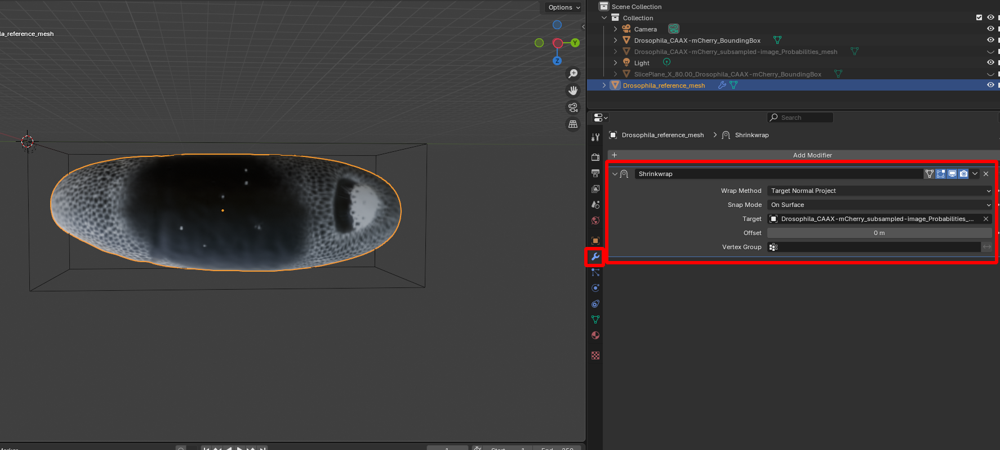

After clicking "Apply" (Ctr+A), the reference mesh is wrapped and we can re-compute the cartographic projection:

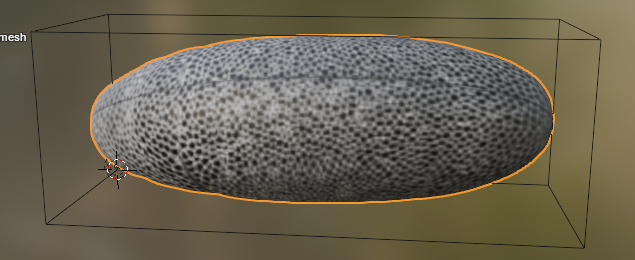

The projected image is now uses the clean cylindrical projection defined for the reference mesh, and we can easily compare it with different recordings: 

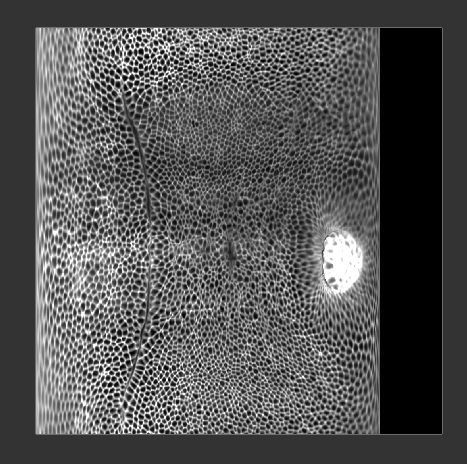


#### Reference mesh approach to time lapse data

We can also apply the reference mesh approach to time-lapse data. The `blender_tissue_cartography` add-on features a button to automatize the align+shrink-wrap process, which is particularly useful for time-lapse imaging. Proceed as follows:

1. If you don't already have a reference mesh, designate one of your time-points as reference timepoint and create a UV map for it.
2. Register + shrink-wrap it to the remaining time-points:

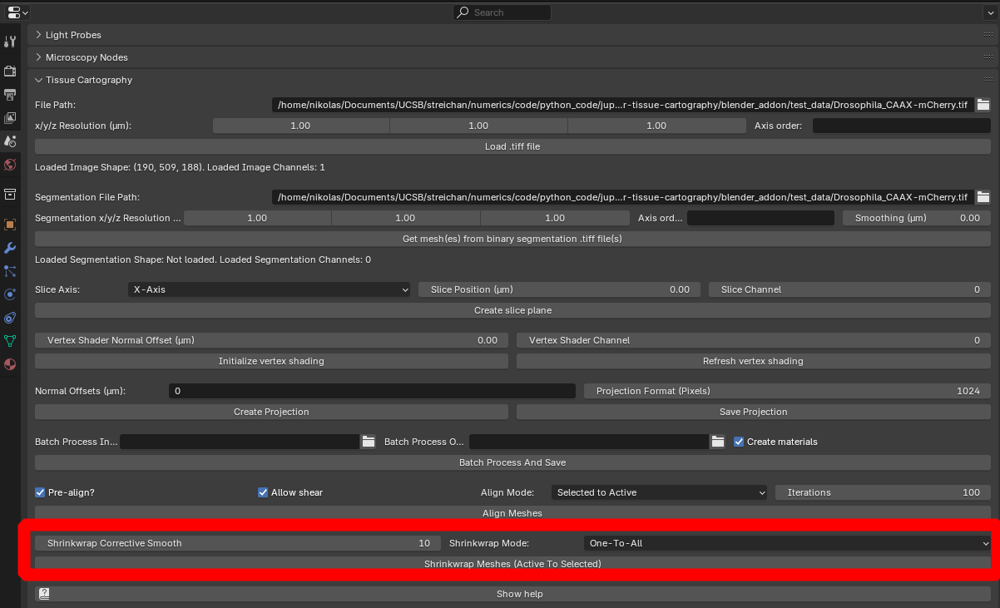

You can try this with the example meshes in `nbs/Tutorials/addon_example/shrinkwrap_meshes`.

The "Shrinkwrap Corrective Smooth" option allows you to compensate for mesh distortion induced by the shrink-wrapping process. The "Shrink-wrap" mode allows you to proceed iteratively: 

1. First shrink-wrap the reference mesh to the first timepoint
2. Duplicate the wrapped mesh, and shrink-wrap it to the second timepoint
3. ...

The meshes are processes in alpha-numerical order, depending on their name (so make sure you name them something like `mesh_timepoint_001, mesh_timepoint_002`). The "Forward" and "Backward" options allow you to start with the first or last timepoint.
   
Choosing a "good" reference timepoint is important. Choose the mesh with the most complicated and/or most representative shape!
You may need to define several reference timepoints if there is a lot of distortion.

Clicking the shrink-wrap button will produce two results: 

1. A mesh called `XXX_wrapped`. This is your reference mesh, deformed to match the shape of the target mesh  and will have the exact same topology (vertices and faces) and UV map as the reference mesh
2. Your target meshes will get a UV map, tranfered over from the wrapped reference mesh. The target mesh will not be altered, but the quality of the UV map (in particular its seams) may be degraded

You can then use both of these outputs for further processing.

##### Automatization & advanced algorithms

If you would like to automatize this process, or use more powerful shrink-wrapping algorithms, you will need to use the `blender_tissue_cartography` library. Please see tutorial 9.

## Next steps

Tutorial 4 introduces the Python library version of `blender_tissue_cartography` which is useful for creating custom or automatized tissue cartography pipelines. Tutorials 5 and 6 teach you more about designing UV maps. Tutorials 8 and 9 give more information on dynamic datasets.